# 0. Imports

In [1]:
import sys

sys.path.append("../src/")

from utils import mean_std_cross_val_scores, mape

import warnings
from pandas.errors import SettingWithCopyWarning

warnings.simplefilter(action="ignore", category=SettingWithCopyWarning)

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from sklearn.compose import ColumnTransformer, make_column_transformer
from sklearn.dummy import DummyRegressor
from sklearn.metrics import (
    make_scorer,
    mean_absolute_error,
    mean_absolute_percentage_error,
    mean_squared_error,
    r2_score,
)
from sklearn.model_selection import cross_val_score, cross_validate, train_test_split
from sklearn.pipeline import Pipeline, make_pipeline
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from utils import mean_std_cross_val_scores

warnings.simplefilter(action="ignore", category=FutureWarning)

import os

import plotly.graph_objects as go
import torch
from torch import nn, optim
from torch.utils.data import DataLoader, TensorDataset
from torchvision import datasets, transforms
from torchvision.transforms import ToTensor

# 1. Data

In [2]:
df = pd.read_csv(
    "../data/processed/seoul_fine_dust_weather_2008_2021_for_ml.csv",
    index_col=0,
    parse_dates=True,
).reset_index()

In [3]:
df.head()

,date,temp(°C),precipitation(mm),wind_speed(m/s),wind_direction,humidity(%),local_P(hPa),cloud_cover,lowest_ceiling(100m),month,PM10_Counts,PM25_Counts,log_PM10_Counts,log_PM25_Counts
0,2008-01-01 10:00:00,-7.6,0.0,4.6,340.0,47.0,1010.7,2.0,12.0,1,30.0,11.0,3.401197,2.397895
1,2008-01-01 11:00:00,-6.9,0.0,4.1,290.0,42.0,1010.7,2.0,12.0,1,29.0,13.0,3.367296,2.564949
2,2008-01-01 12:00:00,-5.8,0.0,4.1,290.0,42.0,1010.7,2.0,12.0,1,29.0,12.0,3.367296,2.484907
3,2008-01-01 13:00:00,-5.0,0.0,4.1,290.0,36.0,1009.9,0.0,10.0,1,28.0,12.0,3.332205,2.484907
4,2008-01-01 14:00:00,-4.4,0.0,4.1,290.0,36.0,1009.9,0.0,10.0,1,27.0,13.0,3.295837,2.564949


In [4]:
df["month"] = df["month"].astype("category")

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 122733 entries, 0 to 122732
Data columns (total 14 columns):
 #   Column                Non-Null Count   Dtype         
---  ------                --------------   -----         
 0   date                  122733 non-null  datetime64[ns]
 1   temp(°C)              122733 non-null  float64       
 2   precipitation(mm)     122733 non-null  float64       
 3   wind_speed(m/s)       122733 non-null  float64       
 4   wind_direction        122733 non-null  float64       
 5   humidity(%)           122733 non-null  float64       
 6   local_P(hPa)          122733 non-null  float64       
 7   cloud_cover           122733 non-null  float64       
 8   lowest_ceiling(100m)  122696 non-null  float64       
 9   month                 122733 non-null  category      
 10  PM10_Counts           122733 non-null  float64       
 11  PM25_Counts           122733 non-null  float64       
 12  log_PM10_Counts       122733 non-null  float64       
 13 

# 2. Train/Test Split

In [6]:
train_df = df.query("date < '2016-01-01 00:00:00'")
test_df = df.query("date >= '2016-01-01 00:00:00'")

train_df.set_index("date", inplace=True)
test_df.set_index("date", inplace=True)

In [7]:
X_train = train_df.drop(
    columns=["PM10_Counts", "PM25_Counts", "log_PM10_Counts", "log_PM25_Counts"]
)
y_train = train_df["log_PM10_Counts"]

X_test = test_df.drop(
    columns=["PM10_Counts", "PM25_Counts", "log_PM10_Counts", "log_PM25_Counts"]
)
y_test = test_df["log_PM10_Counts"]

# 3. Feature Selection

In [8]:
numerical_features = list(X_train.columns)
numerical_features.remove("month")
numerical_features

['temp(°C)',
 'precipitation(mm)',
 'wind_speed(m/s)',
 'wind_direction',
 'humidity(%)',
 'local_P(hPa)',
 'cloud_cover',
 'lowest_ceiling(100m)']

In [9]:
categorical_feature = ["month"]

In [10]:
ct = make_column_transformer(
    (StandardScaler(), numerical_features),
    (OneHotEncoder(handle_unknown="ignore"), categorical_feature),
)

# 4. Deep Learning

## 4.1. Classes and functions

In [11]:
class NeuralNetwork(nn.Module):
    def __init__(self, input_size, output_size):
        super(NeuralNetwork, self).__init__()
        self.flatten = nn.Flatten()
        self.linear_relu_stack = nn.Sequential(
            nn.Linear(input_size, 40),
            nn.ReLU(),
            nn.Dropout(0.2),
            nn.Linear(40, 20),
            nn.ReLU(),
            nn.Dropout(0.2),
            nn.Linear(20, 10),
            nn.ReLU(),
            nn.Dropout(0.2),
            nn.Linear(10, output_size),
        )

    def forward(self, x):
        x = self.flatten(x)
        logits = self.linear_relu_stack(x)
        return logits

In [12]:
def prepare_dataloader(X_train, y_train, batch_size, shuffle=True):
    # generate sequences
    scaled_X_train = ct.fit_transform(X_train)
    scaled_y_train = y_train[:, np.newaxis]
    dataset = TensorDataset(
        torch.tensor(scaled_X_train, dtype=torch.float32)
        .unsqueeze(-1)
        .permute(0, 2, 1),
        torch.tensor(scaled_y_train, dtype=torch.float32),
    )
    dataloader = DataLoader(
        dataset, batch_size=batch_size, shuffle=shuffle, drop_last=True
    )
    return dataloader, scaled_X_train, scaled_y_train

In [13]:
def trainer(
    model, criterion, optimizer, trainloader, validloader, epochs=5, verbose=True
):
    """Simple training wrapper for PyTorch network."""

    train_loss, valid_loss, train_MAE, valid_MAE = [], [], [], []
    for epoch in range(epochs):
        train_batch_loss = 0
        valid_batch_loss = 0
        train_batch_mae = 0
        valid_batch_mae = 0

        # Training
        for X, y in trainloader:
            optimizer.zero_grad()  # Zero all the gradients w.r.t. parameters
            # X = X.to(device)
            # y = y.to(device)
            y_hat = model(X.reshape(X.shape[0], -1))  # Reshape data
            loss = criterion(y_hat, y)  # Calculate loss based on output
            loss.backward()  # Calculate gradients w.r.t. parameters
            optimizer.step()  # Update parameters
            train_batch_loss += loss.item()  # Add loss for this batch to running total
            train_batch_mae += mean_absolute_error(
                y.detach().numpy(), y_hat.detach().numpy()
            ).mean()
        train_loss.append(train_batch_loss / len(trainloader))
        train_MAE.append(train_batch_mae / len(trainloader))  # MAE

        # Validation
        model.eval()
        with torch.no_grad():
            for X, y in validloader:
                # X = X.to(device)
                # y = y.to(device)
                y_hat = model(
                    X.reshape(X.shape[0], -1)
                )  # Reshape data to (batch_size, 784) and forward pass to get output
                loss = criterion(y_hat, y)
                valid_batch_loss += loss.item()
                valid_batch_mae += mean_absolute_error(
                    y.detach().numpy(), y_hat.detach().numpy()
                ).mean()
        valid_loss.append(valid_batch_loss / len(validloader))
        valid_MAE.append(valid_batch_mae / len(validloader))

        model.train()

        # Print progress
        if verbose:
            if epoch % 20 == 0:
                print(
                    f"Epoch {epoch}:",
                    f"Train Loss: {train_loss[-1]:.3f}.",
                    f"Valid Loss: {valid_loss[-1]:.3f}.",
                    f"Train MAE: {train_MAE[-1]:.2f}."
                    f"Valid MAE: {valid_MAE[-1]:.2f}.",
                )

    print("\nTraining ended.")

    return train_loss, valid_loss

## 4.2. Neural Network Set Up & Training

In [14]:
X_train.shape

(70125, 9)

In [15]:
torch.manual_seed(42)

model = NeuralNetwork(20, 1)
optimizer = optim.Adam(model.parameters())
criterion = torch.nn.L1Loss()
BATCH_SIZE = 25

In [16]:
X_train_t = X_train.iloc[:35063, :]
y_train_t = y_train[:35063]

X_train_v = X_train.iloc[35063:, :]
y_train_v = y_train[35063:]

In [17]:
trainloader, scaled_X_train_t, scaled_y_train_t = prepare_dataloader(
    X_train_t, y_train_t, batch_size=BATCH_SIZE, shuffle=True
)
validloader, scaled_X_train_v, scaled_y_train_v = prepare_dataloader(
    X_train_v, y_train_v, batch_size=BATCH_SIZE, shuffle=True
)

In [18]:
train_loss, valid_loss = trainer(
    model, criterion, optimizer, trainloader, validloader, epochs=100, verbose=True
)

Epoch 0: Train Loss: 0.954. Valid Loss: 0.433. Train MAE: 0.95.Valid MAE: 0.43.
Epoch 20: Train Loss: 0.385. Valid Loss: 0.412. Train MAE: 0.38.Valid MAE: 0.41.
Epoch 40: Train Loss: 0.377. Valid Loss: 0.412. Train MAE: 0.38.Valid MAE: 0.41.
Epoch 60: Train Loss: 0.376. Valid Loss: 0.415. Train MAE: 0.38.Valid MAE: 0.42.
Epoch 80: Train Loss: 0.374. Valid Loss: 0.425. Train MAE: 0.37.Valid MAE: 0.42.

Training ended.


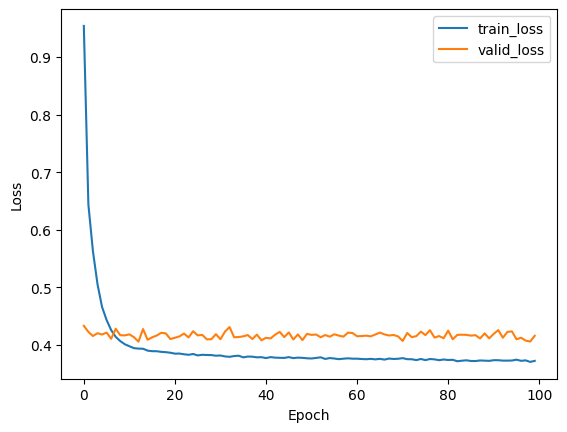

In [19]:
loss_dict = {"train_loss": train_loss, "valid_loss": valid_loss}
loss_df = pd.DataFrame(loss_dict)
loss_df.plot.line()
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.show();

# 5. Prediction

In [20]:
testloader, scaled_X_test, scaled_y_test = prepare_dataloader(
    X_test, y_test, batch_size=1, shuffle=False
)

In [21]:
scaled_prediction = []

for X, _ in testloader:
    y_pred = model(X.reshape(X.shape[0], -1))
    scaled_prediction.append(y_pred.item())

In [22]:
prediction = np.exp(scaled_prediction)

In [23]:
test_df.loc[:, "prediction_by_deep_learning"] = prediction

## 5.1 Hourly Prediction

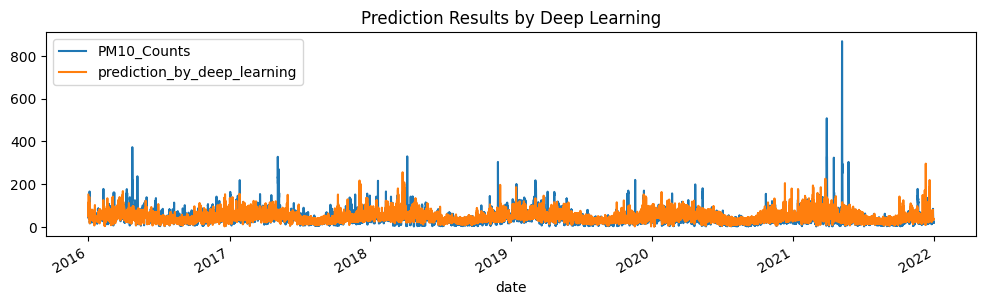

In [24]:
fig = test_df[["PM10_Counts", "prediction_by_deep_learning"]].plot(figsize=(12, 3))
fig.set_title("Prediction Results by Deep Learning")
plt.show()

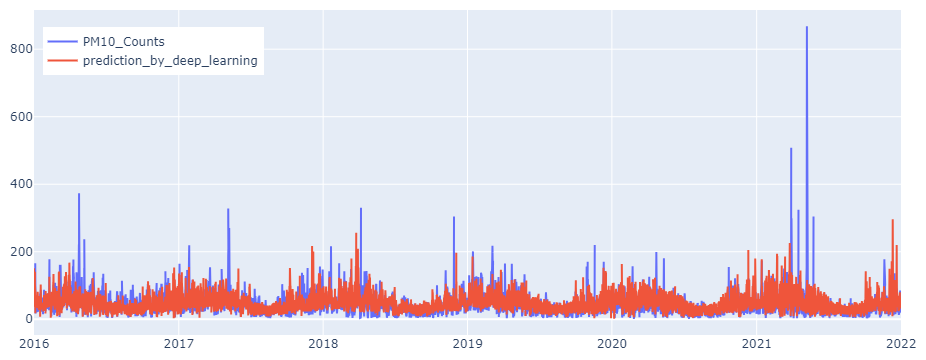

In [25]:
fig = go.Figure()
fig.add_scatter(x=test_df.index, y=test_df["PM10_Counts"], name="PM10_Counts")
fig.add_scatter(
    x=test_df.index,
    y=test_df["prediction_by_deep_learning"],
    name="prediction_by_deep_learning",
)
fig.update_layout(
    autosize=False, width=1000, height=300, margin=dict(l=10, r=10, t=10, b=10)
)
fig.update_layout(legend=dict(yanchor="bottom", y=0.8, xanchor="left", x=0.01))
fig.show();

## 5.2. Monthly Prediction

In [26]:
test_df_1 = test_df.copy()

In [27]:
test_df_1.reset_index(inplace=True)

In [28]:
test_df_1["year_month"] = test_df_1["date"].dt.to_period("M")

In [29]:
test_df_1.head()

,date,temp(°C),precipitation(mm),wind_speed(m/s),wind_direction,humidity(%),local_P(hPa),cloud_cover,lowest_ceiling(100m),month,PM10_Counts,PM25_Counts,log_PM10_Counts,log_PM25_Counts,prediction_by_deep_learning,year_month
0,2016-01-01 00:00:00,-1.9,0.0,0.1,0.0,85.0,1022.1,0.0,10.0,1,90.0,61.0,4.499810,4.110874,151.041303,2016-01
1,2016-01-01 10:00:00,-0.6,0.0,1.1,90.0,72.0,1022.7,6.0,10.0,1,81.0,54.0,4.394449,3.988984,61.493518,2016-01
2,2016-01-01 11:00:00,1.5,0.0,1.3,140.0,70.0,1022.5,8.0,10.0,1,84.0,56.0,4.430817,4.025352,57.210240,2016-01
3,2016-01-01 12:00:00,2.2,0.0,1.9,140.0,66.0,1021.4,9.0,10.0,1,85.0,59.0,4.442651,4.077537,65.703553,2016-01
4,2016-01-01 13:00:00,3.1,0.0,1.3,140.0,60.0,1020.1,8.0,10.0,1,82.0,56.0,4.406719,4.025352,71.742116,2016-01


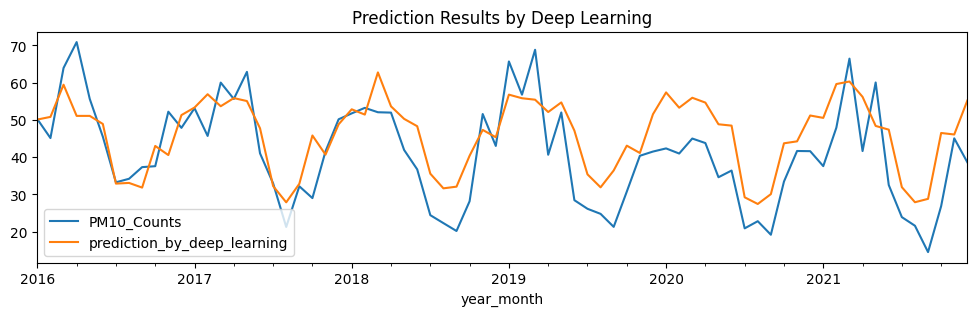

In [30]:
fig = (
    test_df_1.groupby(["year_month"])[["PM10_Counts", "prediction_by_deep_learning"]]
    .mean()
    .plot(figsize=(12, 3))
)
fig.set_title("Prediction Results by Deep Learning")
plt.show()

## 5.3. Check on Prediction Error(MAPE) 

In [31]:
mape(np.log(test_df["PM10_Counts"]), np.log(test_df["prediction_by_deep_learning"]))

15.047994366573207

In [32]:
mape(test_df["PM10_Counts"], test_df["prediction_by_deep_learning"])

67.26797819886204

## 5.4. Model Save

In [33]:
torch.save(model, "../models/nn_model.pth")